# Loans from the Development Credit Authority (DCA) 
In this part of the project, we focus on loans provided by DCA to developing countries around the World; how are they distributed and which sectors do they target the most.

In [1]:
# Import the required libraries and dependencies
import datetime as dt
import panel as pn
import pandas as pd
import numpy as np
import seaborn as sns
import random
import hvplot.pandas
import holoviews as hv
from pathlib import Path

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Create a path to the file and read into a dataframe
path = Path("Resources/Data/Development_Credit_Authority_DCA.csv")
dca_data = pd.read_csv(path)

## Data Cleaning

In [3]:
# A look at the columns
for col in dca_data.columns:
    print(col)

Guarantee Number
Transaction Report ID
Guarantee Country Name
Amount (USD)
Currency Name
Disbursement Date
End Date
Business Sector
City/Town
State/Province/Region Name
State/Province/Region Code
State/Province/Region Country Name
Region Name
Is Woman Owned?
Is First Time Borrower?
Business Size
Latitude
Longitude


In [4]:
# Extract columns of interest and rename
columns = ["State/Province/Region Country Name", "State/Province/Region Name", "Disbursement Date", "Business Sector", "Amount (USD)", "Is First Time Borrower?", "Is Woman Owned?", "Latitude", "Longitude"]
dca_data = dca_data[columns]
dca_data.rename(columns = {"Disbursement Date": "date", "Amount (USD)": "loan_amount", "Business Sector": "sector", "State/Province/Region Country Name": "country", "State/Province/Region Name": "region", "Longitude": "longitude", "Latitude": "latitude", "Is Woman Owned?": "is_woman_owned", "Is First Time Borrower?": "is_first_timer"}, inplace=True)
dca_data

,country,region,date,sector,loan_amount,is_first_timer,is_woman_owned,latitude,longitude
0,Peru,Cusco,09/20/2011 12:00:00 AM,NaN,9.801444e+05,1,0,-13.518333,-71.978056
1,Peru,Puno,09/20/2011 12:00:00 AM,NaN,1.960289e+06,0,0,-15.000000,-70.000000
2,Peru,Lima,01/18/2012 12:00:00 AM,NaN,2.007491e+06,1,0,-12.000000,-76.833333
3,NaN,NaN,04/11/2012 12:00:00 AM,NaN,1.030888e+06,0,0,NaN,NaN
4,Peru,Cusco,08/15/2012 12:00:00 AM,NaN,1.780000e+06,0,0,-13.518333,-71.978056
...,...,...,...,...,...,...,...,...,...
186540,NaN,NaN,10/03/2008 12:00:00 AM,Other Service,4.760286e+04,0,0,NaN,NaN
186541,NaN,NaN,10/03/2008 12:00:00 AM,Other Service,5.440326e+04,1,0,NaN,NaN
186542,NaN,NaN,10/03/2008 12:00:00 AM,Other Service,5.100306e+04,1,0,NaN,NaN
186543,NaN,NaN,10/31/2008 12:00:00 AM,Information & Communication Technologies,3.740224e+04,0,0,NaN,NaN


In [5]:
dca_data.dropna(inplace=True)
dca_data.reset_index(drop=True, inplace=True)
dca_data

,country,region,date,sector,loan_amount,is_first_timer,is_woman_owned,latitude,longitude
0,South Africa,North-West,07/31/2012 12:00:00 AM,Trade/Commerce,54578.5324,0,0,-26.716667,27.100000
1,South Africa,KwaZulu-Natal,03/23/2013 12:00:00 AM,Other Service,288738.5438,1,1,-29.857896,31.029198
2,South Africa,Free State,06/11/2013 12:00:00 AM,Agriculture,89099.6499,1,0,-26.903296,27.457268
3,South Africa,Gauteng,07/26/2013 12:00:00 AM,Trade/Commerce,146061.6088,1,0,-26.066788,28.046944
4,South Africa,KwaZulu-Natal,08/01/2013 12:00:00 AM,Trade/Commerce,287182.9082,1,0,-29.857896,31.029198
...,...,...,...,...,...,...,...,...,...
91808,Nigeria,Nigeria (general),08/01/2008 12:00:00 AM,Agriculture,67998.3000,0,0,9.250000,6.933333
91809,Nigeria,Enugu,08/08/2008 12:00:00 AM,Agriculture,67998.3000,0,0,6.500000,7.500000
91810,Nigeria,Anambra,08/11/2008 12:00:00 AM,Agriculture,67998.3000,0,0,6.145430,6.788452
91811,Nigeria,Lagos,08/15/2008 12:00:00 AM,Agriculture,67998.3000,0,0,6.453056,3.395833


<AxesSubplot:ylabel='loan_amount'>

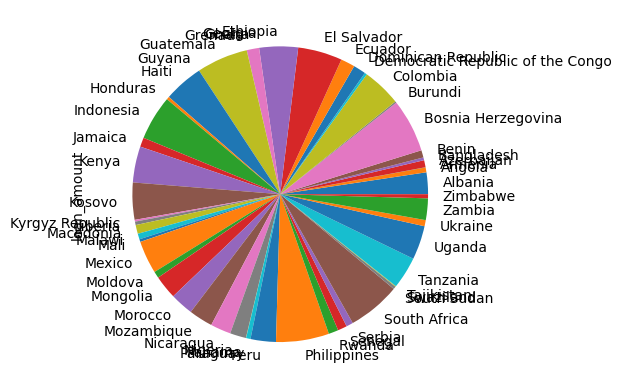

In [6]:
# Distribution of DCA by country
dca_data_by_country = dca_data.groupby("country").sum()
dca_data_by_country.plot(kind='pie', y='loan_amount', legend=False)

<AxesSubplot:ylabel='loan_amount'>

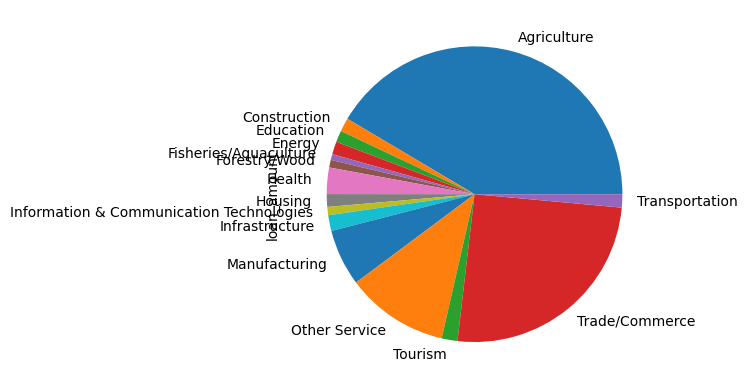

In [7]:
# Distribution of DCA by sectors
dca_data_by_sector = dca_data.groupby("sector").sum()
dca_data_by_sector.plot(kind='pie', y='loan_amount', legend=False)

Agriculture and Trade/Commerce account for more than 50% of the Development-Credit-Authority loans; with no specific country or region dominating the recipients.

In [8]:
# Distribution of DCA by individual recipients
dca_data_by_woman = dca_data.groupby(["is_woman_owned"]).sum()
dca_data_by_first = dca_data.groupby("is_first_timer").sum()
dca_data_by_woman.sort_values('loan_amount')['loan_amount'].hvplot.bar(rot=45, color="green") + dca_data_by_first.sort_values('loan_amount')['loan_amount'].hvplot.bar(rot=45)

:Layout
   .Bars.Loan_amount.I  :Bars   [is_woman_owned]   (loan_amount)
   .Bars.Loan_amount.II :Bars   [is_first_timer]   (loan_amount)

Women and first timers are less likely to get the loans; with the discrepancy for women much severe.

In [9]:
# A map plot to analyze the loan information
dca_data.hvplot.points(
    'longitude', 
    'latitude', 
    geo=True, 
    color='country',
    hover_cols=['sector'],
    tiles='OSM',
    frame_width=700,
    frame_height=500,
    title='Development-Credit-Authority Loans around the World per country')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [longitude,latitude]   (country,sector)

In [10]:
# A map plot to analyze the loan information per sectors
dca_data.hvplot.points(
    'longitude', 
    'latitude', 
    geo=True, 
    color='sector',
    hover_cols=['region'],
    tiles='OSM',
    frame_width=700,
    frame_height=500,
    title='Development-Credit-Authority Loans around the World per sector')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [longitude,latitude]   (sector,region)